# Compare snow cover products

In [1]:
# To reload external files automatically (ex: utils)
%load_ext autoreload
%autoreload 2

import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import proplot as plot # New plot library (https://proplot.readthedocs.io/en/latest/)
plot.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import xesmf as xe # For regridding (https://xesmf.readthedocs.io/en/latest/)

import sys
sys.path.insert(1, '/home/mlalande/notebooks/utils') # to include my util file in previous directory
# sys.path.insert(1, '/home/lalandmi/Dropbox/Thèse/notebooks/utils') # to include my util file in previous directory
import utils as u # my personal functions
u.check_python_version()
# u.check_virtual_memory()

3.8.5 | packaged by conda-forge | (default, Jul 24 2020, 01:25:15) 
[GCC 7.5.0]


In [2]:
# For parallelisation
from dask.distributed import Client
# client = Client(n_workers=32, threads_per_worker=1, memory_limit='6GB')
client = Client(n_workers=16, threads_per_worker=1, memory_limit='4GB')
# client = Client()
client

Client Scheduler: tcp://127.0.0.1:45846 Dashboard: http://127.0.0.1:8787/status,Cluster Workers: 16 Cores: 16 Memory: 64.00 GB


## Set variables

In [3]:
period = slice('2001','2012')
latlim, lonlim = u.get_domain_HMA()
seasons = ['Annual', 'DJFMA', 'JJAS']
# root_data_path = '/home/lalandmi/Dropbox/data/' # local
root_data_path = '/data/mlalande/' # CICLAD

# Make a extended version for regridding properly on the edges
latlim_ext, lonlim_ext = slice(latlim.start-5, latlim.stop+5), slice(lonlim.start-5, lonlim.stop+5)

# Get zone limits for annual cycle
lonlim_HK, latlim_HK, lonlim_HM, latlim_HM, lonlim_TP, latlim_TP = u.get_zones()

# HMA for full domain and the following for the above zones
zones = ['HMA', 'HK', 'HM', 'TP']
zones_df = pd.DataFrame(
    [[lonlim, latlim], [lonlim_HK, latlim_HK], [lonlim_HM, latlim_HM], [lonlim_TP, latlim_TP]], 
    columns=pd.Index(['lonlim', 'latlim'], name='Limits'),
    index=pd.Index(zones, name='Zones')
)

## Load topo

In [8]:
ds = xr.open_dataset(root_data_path+'GMTED2010/GMTED2010_15n060_0250deg.nc').drop_dims('nbounds').swap_dims(
    {'nlat': 'latitude', 'nlon': 'longitude'}).drop({'nlat', 'nlon'}).rename(
    {'latitude': 'lat', 'longitude': 'lon'}).sel(lat=latlim_ext, lon=lonlim_ext)
elevation = ds.elevation
elevation_std = ds.elevation_stddev

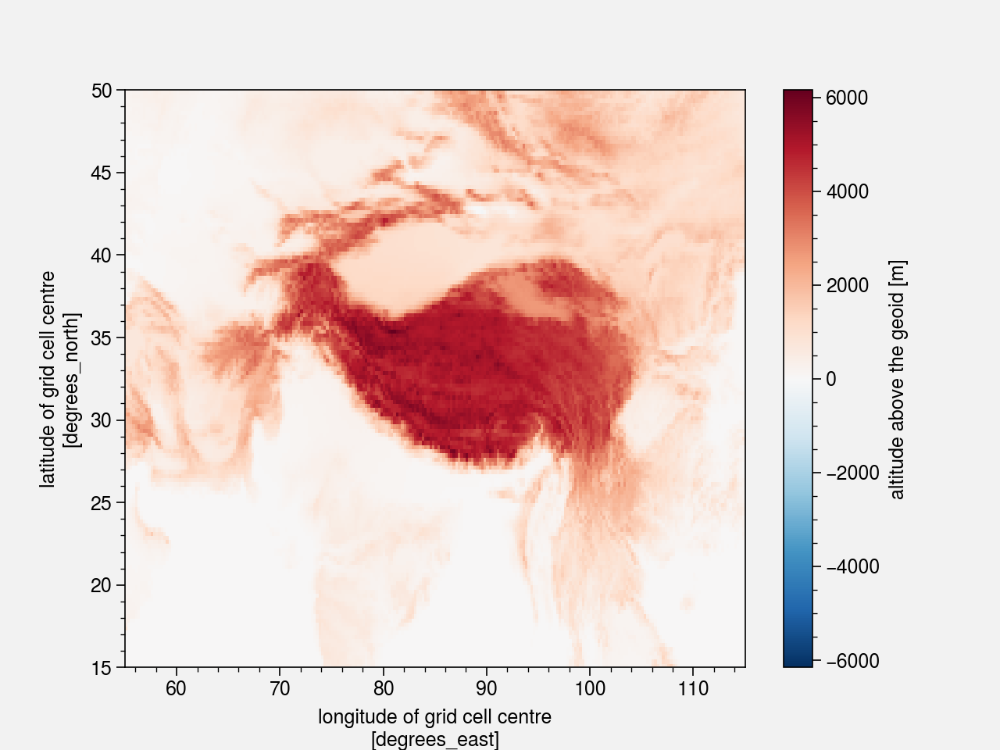

In [4]:
elevation.plot()

## NOAA CDR

In [9]:
ds_rutger = xr.open_dataset(root_data_path+'NOAA_CDR_NH_SCE/nhsce_v01r01_19661004_20201005.nc').sel(time=period)
with xr.set_options(keep_attrs=True): # Get the snc variable, keep only land data and convert to %
    obs = ds_rutger.snow_cover_extent.where(ds_rutger.land == 1)*100   
obs.attrs['units'] = '%'
obs = obs.rename({'longitude': 'lon', 'latitude': 'lat'}) # Rename lon and lat for the regrid

# Resamble data per month (from per week)
obs = obs.resample(time='1MS').mean('time', skipna=False, keep_attrs=True)

# Check if the time steps are ok
np.testing.assert_equal((int(period.stop) - int(period.start) + 1)*12, obs.time.size)

# Because obs are not global (https://github.com/JiaweiZhuang/xESMF/issues/15)
import scipy
def add_matrix_NaNs(regridder):
        X = regridder.weights
        M = scipy.sparse.csr_matrix(X)
        num_nonzeros = np.diff(M.indptr)
        M[num_nonzeros == 0, 0] = np.NaN
        regridder.weights = scipy.sparse.coo_matrix(M)
        return regridder

regridder = xe.Regridder(obs, elevation, 'bilinear', periodic=False, reuse_weights=True)
regridder = add_matrix_NaNs(regridder)
noaa_cdr = regridder(obs)

/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  grouper = pd.Grouper(


Reuse existing file: bilinear_88x88_140x240.nc


/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/scipy/sparse/_index.py:124: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


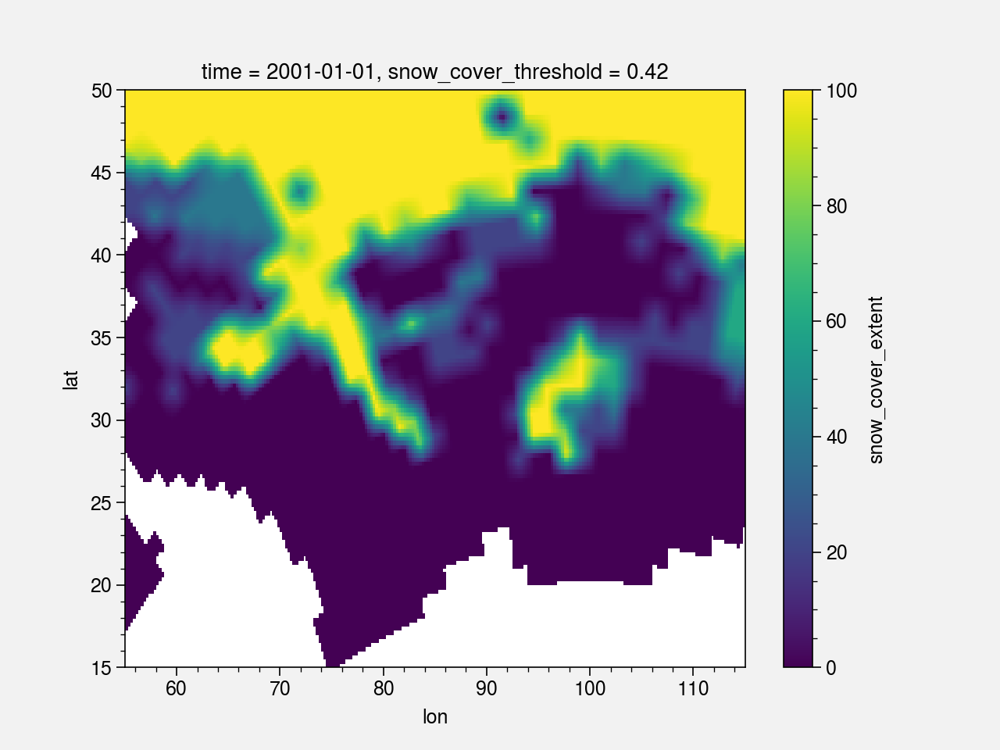

In [6]:
noaa_cdr[0].plot()

## NOAA CDR HR
I select only values with valid lat and lon for regrid: .isel(x=slice(158,867), y=slice(158,867)) (missing lat/lon values are set to ~9.9e+36)

In [10]:
ds_rutger = xr.open_dataset(root_data_path+'NOAA_CDR_NH_SCE/G10035-rutgers-nh-24km-weekly-sce-v01r00-19800826-20200831_newer_without_xy.nc').sel(time=period).isel(x=slice(158,867), y=slice(158,867))
with xr.set_options(keep_attrs=True): # Get the snc variable, keep only land data and convert to %
    obs = ds_rutger.snow_cover_extent.where(ds_rutger.land == 1)*100   
obs.attrs['units'] = '%'
obs = obs.rename({'longitude': 'lon', 'latitude': 'lat'}) # Rename lon and lat for the regrid

# Resamble data per month (from per week)
obs = obs.resample(time='1MS').mean('time', skipna=False, keep_attrs=True)

# Check if the time steps are ok
np.testing.assert_equal((int(period.stop) - int(period.start) + 1)*12, obs.time.size)

# Because obs are not global (https://github.com/JiaweiZhuang/xESMF/issues/15)
import scipy
def add_matrix_NaNs(regridder):
        X = regridder.weights
        M = scipy.sparse.csr_matrix(X)
        num_nonzeros = np.diff(M.indptr)
        M[num_nonzeros == 0, 0] = np.NaN
        regridder.weights = scipy.sparse.coo_matrix(M)
        return regridder

regridder = xe.Regridder(obs, elevation, 'bilinear', periodic=False, reuse_weights=True)
regridder = add_matrix_NaNs(regridder)
noaa_cdr_hr = regridder(obs)

/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  grouper = pd.Grouper(


Reuse existing file: bilinear_709x709_140x240.nc


/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/scipy/sparse/_index.py:124: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


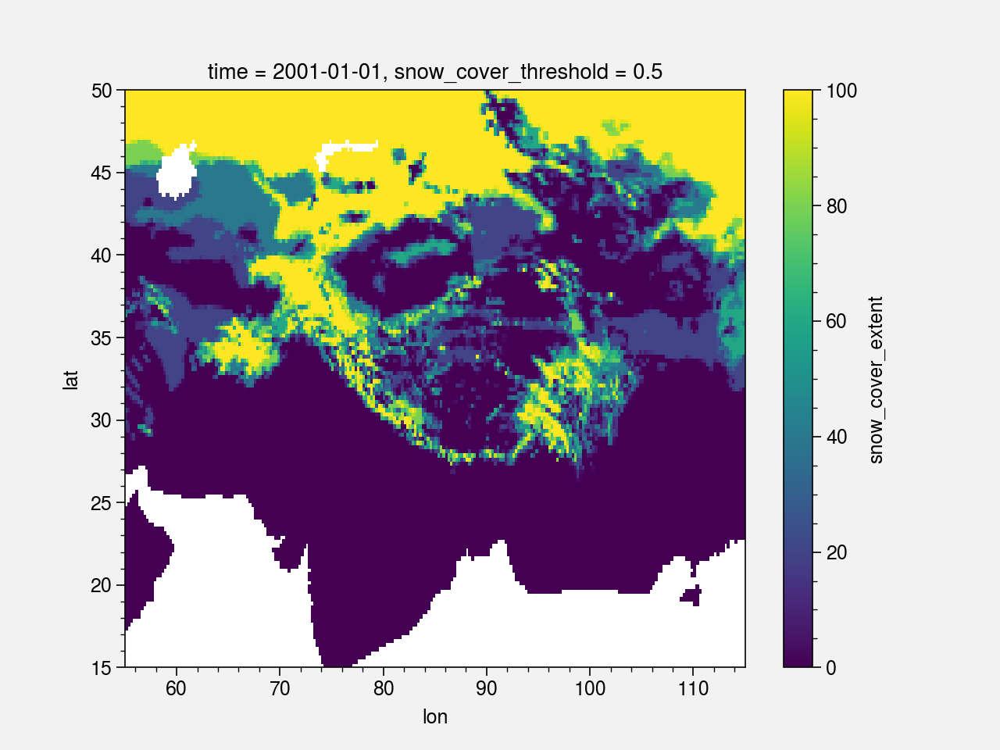

In [8]:
noaa_cdr_hr[0].plot()

## MEaSUREs
https://nsidc.org/data/nsidc-0530

In [11]:
obs = xr.open_mfdataset(
    root_data_path+'MEaSUREs/monthly/nhtsd25e2_*_v01r01.nc', combine='by_coords'
).merged_snow_cover_extent.sel(time=period).load() * 100
obs = obs.rename({'longitude': 'lon', 'latitude': 'lat'})

In [12]:
# Check if the time steps are ok
np.testing.assert_equal((int(period.stop) - int(period.start) + 1)*12, obs.time.size)

# Because obs are not global (https://github.com/JiaweiZhuang/xESMF/issues/15)
import scipy
def add_matrix_NaNs(regridder):
        X = regridder.weights
        M = scipy.sparse.csr_matrix(X)
        num_nonzeros = np.diff(M.indptr)
        M[num_nonzeros == 0, 0] = np.NaN
        regridder.weights = scipy.sparse.coo_matrix(M)
        return regridder

regridder = xe.Regridder(obs, elevation, 'bilinear', periodic=False, reuse_weights=True)
regridder = add_matrix_NaNs(regridder)
measures = regridder(obs)

Reuse existing file: bilinear_720x720_140x240.nc


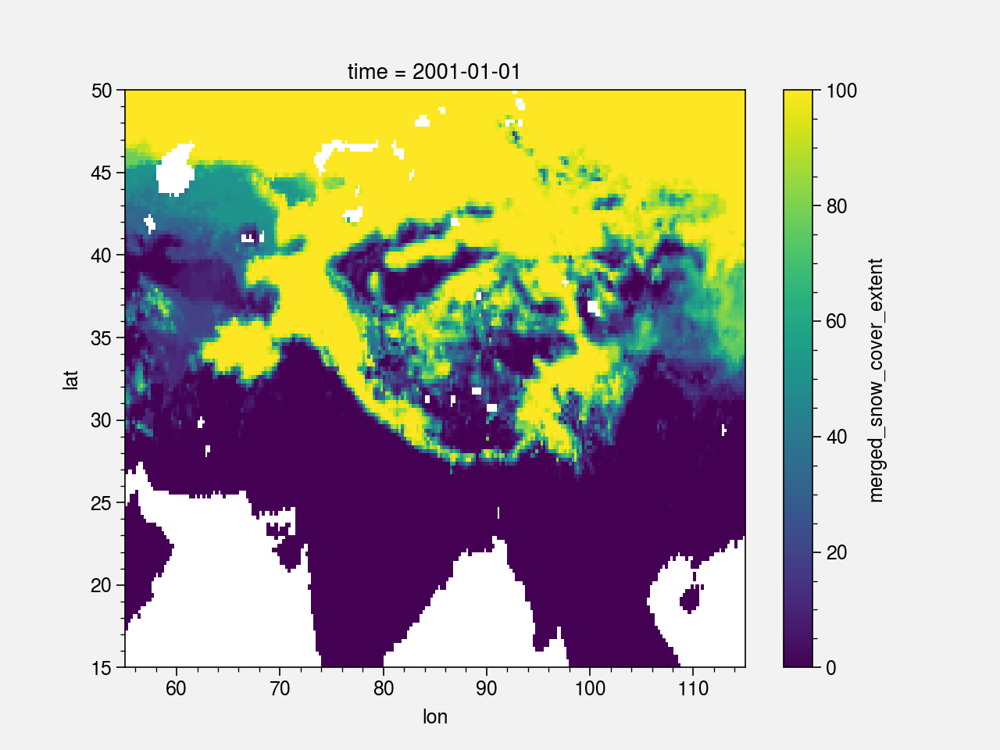

In [11]:
measures[0].plot()

## ESA snow CCI

In [13]:
obs = xr.open_dataarray(
    root_data_path+'ESACCI/ESA_CCI_snow_SCFG_v1.0_HKH_gapfilled_monthly/ESACCI-L3C_SNOW-SCFG-AVHRR_MERGED-fv1.0_HKH_gapfilled_montlhy_1982-2014.nc'
).sel(time=period)

# Check if the time steps are ok
np.testing.assert_equal((int(period.stop) - int(period.start) + 1)*12, obs.time.size)

# # Because obs are not global (https://github.com/JiaweiZhuang/xESMF/issues/15)
# import scipy
# def add_matrix_NaNs(regridder):
#         X = regridder.weights
#         M = scipy.sparse.csr_matrix(X)
#         num_nonzeros = np.diff(M.indptr)
#         M[num_nonzeros == 0, 0] = np.NaN
#         regridder.weights = scipy.sparse.coo_matrix(M)
#         return regridder

# regridder = xe.Regridder(obs, elevation, 'bilinear', periodic=False, reuse_weights=True)
# regridder = add_matrix_NaNs(regridder)
# snow_cci = regridder(obs)

snow_cci = obs

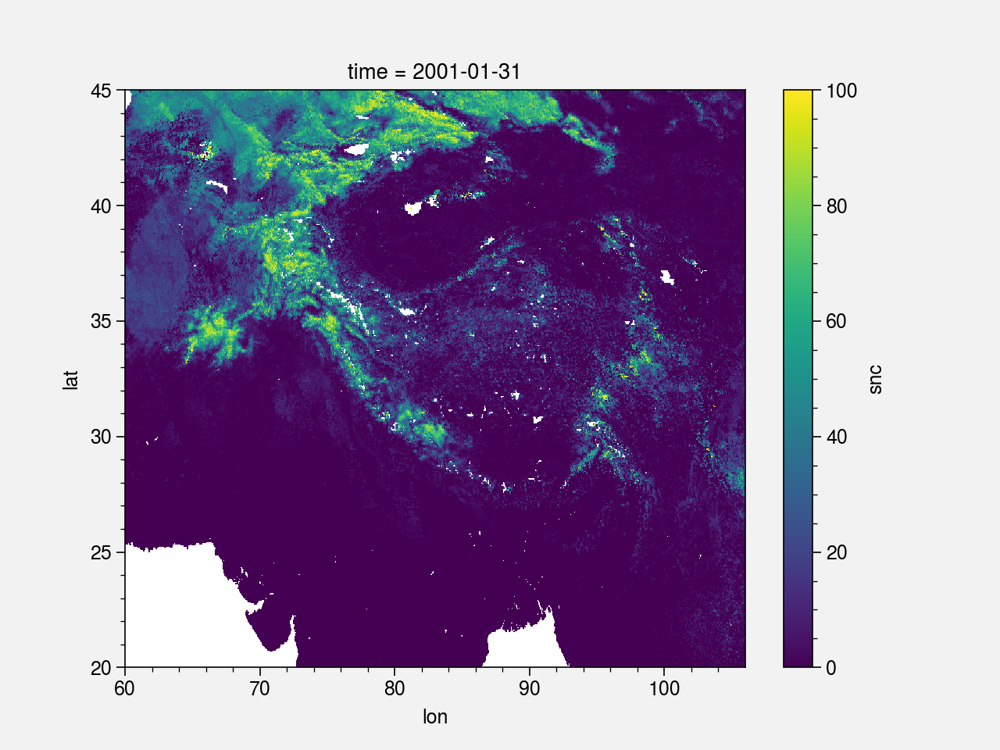

In [13]:
snow_cci[0].plot()

## ESA snow CCI AVHRR (linear interpolation 10 days maxgap)
https://github.com/mickaellalande/PhD/blob/master/local/ESA_CCI_snow/snowCCI_preprocess_AVHRR_gricad_v1.ipynb

In [14]:
ds = xr.open_mfdataset('/data/mmenegoz/monthly/*-monthly-ESACCI-L3C_SNOW-SCFG-AVHRR_MERGED-fv2.0_interp.nc', parallel=True).sel(time=period, lat=latlim, lon=lonlim)
mask_ice = ds.mask_ice[0]
# Check if the time steps are ok
np.testing.assert_equal((int(period.stop) - int(period.start) + 1)*12, ds.time.size)

snow_cci_interp = ds.scfg_interp

In [30]:
mask_ice = ds.mask_ice[0]

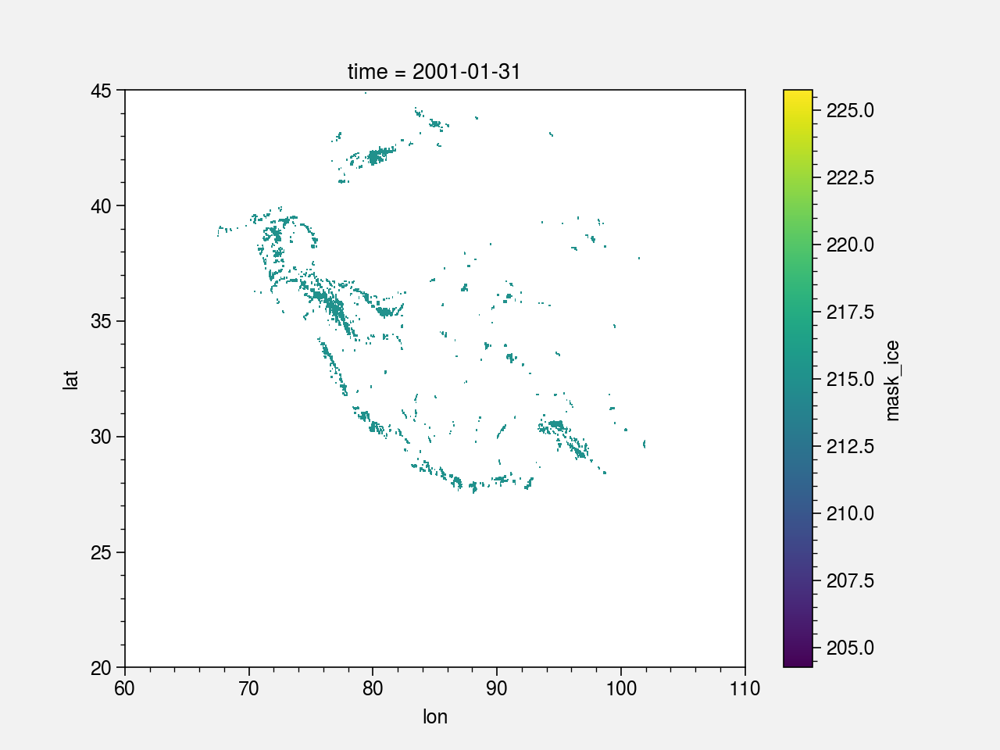

In [31]:
mask_ice.plot()

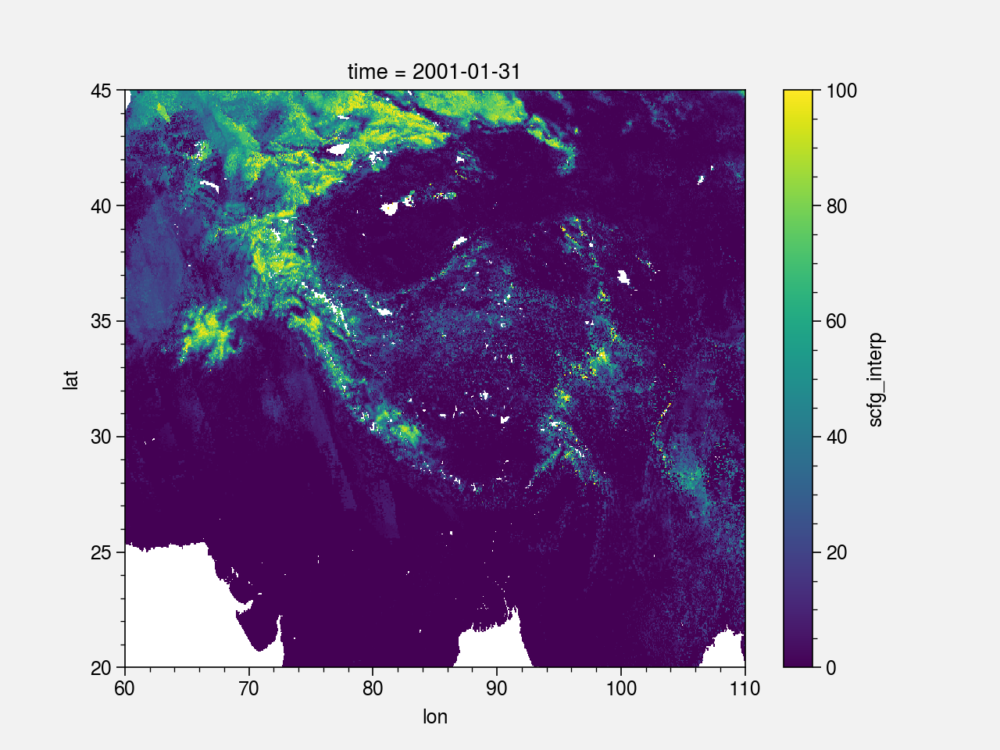

In [29]:
snow_cci_interp[0].plot()

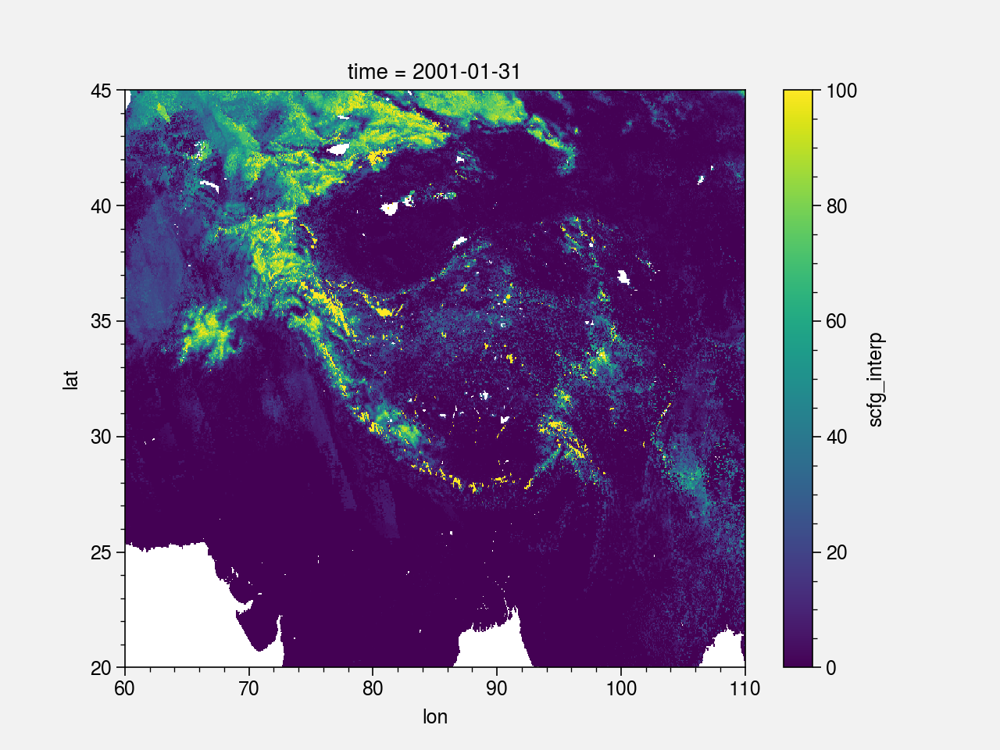

In [35]:
snow_cci_interp[0].where(mask_ice != 215, 100).plot()

## MODIS/Terra Snow Cover Monthly L3 Global 0.05Deg CMG, Version 6

Check http://localhost:7227/tree/notebooks/Observations/MODIS/MOD10CM for pretreatment (hdf -> netcdf)

https://nsidc.org/data/MOD10CM

Grid
The MODIS CMG consists of 7200 columns by 3600 rows. Each cell has a resolution of 0.05 degrees (approximately 5 km). The upper-left corner of the upper-left cell is -180.00 degrees longitude, 90.00 degrees latitude. The lower-right corner of the lower right cell is -180.00 degrees longitude, -90.00 degrees latitude. For additional details about the MODIS Climate Modeling Grid, see the NASA MODIS Lands | MODIS Grids Web page.

The following resources can help you select and work with gridded MODIS data:

HDF-EOS to GeoTIFF Conversion Tool (HEG)

Other products: https://modis.gsfc.nasa.gov/data/dataprod/mod10.php  
More info on grids: https://modis-land.gsfc.nasa.gov/MODLAND_grid.html

In [15]:
obs_longname = 'MODIS/Terra Snow Cover Monthly L3 Global 0.05Deg CMG, Version 6'
obs_name = 'MOD10C1'

obs = xr.open_mfdataset('/data/mlalande/MODIS/MOD10CM/netcdf/*.nc', combine='by_coords', parallel=True).sel(lat=slice(latlim_ext.stop, latlim_ext.start), lon=lonlim_ext, time=period).Snow_Cover_Monthly_CMG
modis = obs.where(obs <= 100)

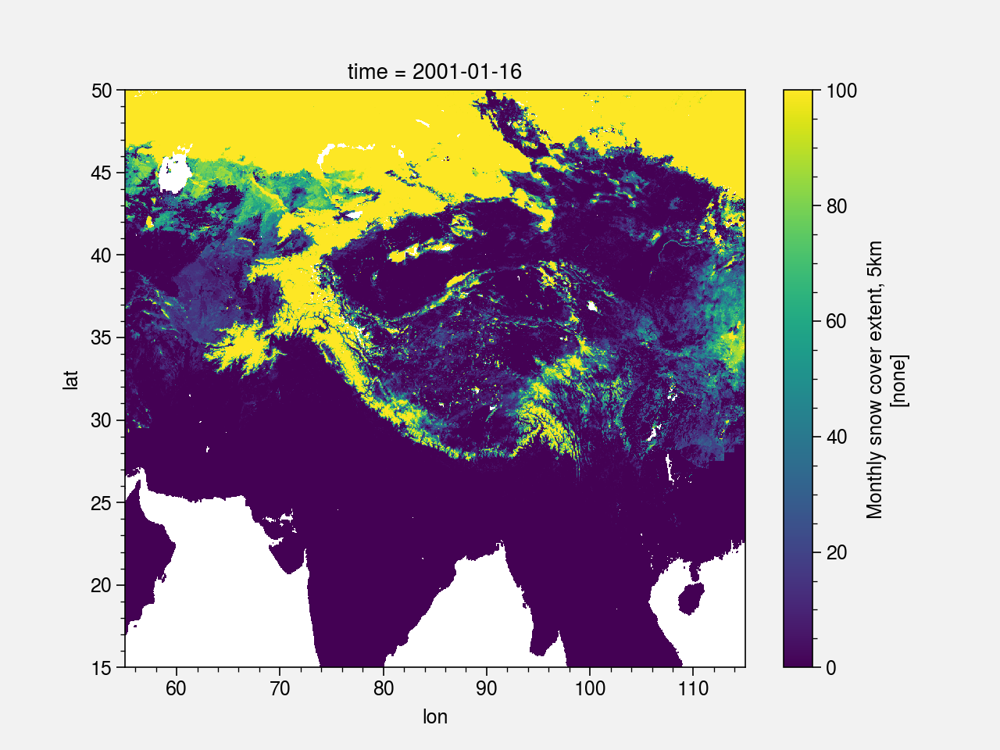

In [32]:
modis[0].plot()

# Compare time series

In [16]:
snow_cci_interp_ts = (u.spatial_average(snow_cci_interp.sel(lat=latlim, lon=lonlim))).load()
snow_cci_interp_icefilled_ts = (u.spatial_average(snow_cci_interp.where(mask_ice != 215, 100).sel(lat=latlim, lon=lonlim))).load()
snow_cci_ts = (u.spatial_average(snow_cci.sel(lat=slice(45, 20), lon=lonlim))).load()
noaa_cdr_ts = (u.spatial_average(noaa_cdr.sel(lat=latlim, lon=lonlim))).load()
noaa_cdr_hr_ts = (u.spatial_average(noaa_cdr_hr.sel(lat=latlim, lon=lonlim))).load()
modis_ts = (u.spatial_average(modis.sel(lat=slice(45, 20), lon=lonlim))).load()
measures_ts = (u.spatial_average(measures.sel(lat=latlim, lon=lonlim))).load()

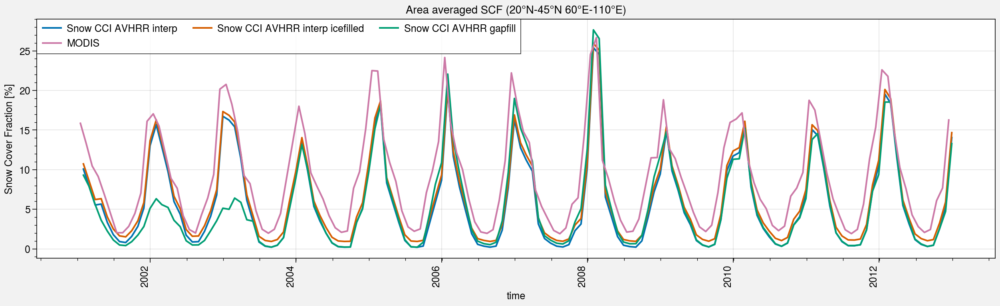

In [17]:
fig, axs = plot.subplots(aspect=4, axwidth=12)

snow_cci_interp_ts.plot(ax= axs[0], label='Snow CCI AVHRR interp')
snow_cci_interp_icefilled_ts.plot(ax= axs[0], label='Snow CCI AVHRR interp icefilled')
snow_cci_ts.plot(ax= axs[0], label='Snow CCI AVHRR gapfill')
# noaa_cdr_ts.plot(ax= axs[0], label='NOAA CDR')
# noaa_cdr_hr_ts.plot(ax= axs[0], label='NOAA CDR HR')
modis_ts.plot(ax= axs[0], label='MODIS')
# measures_ts.plot(ax= axs[0], label='measures')

axs.legend()

axs.format(
    ylabel='Snow Cover Fraction [%]',
    title='Area averaged SCF (20°N-45°N 60°E-110°E)'
)

fig.save('img/compare_icefill_ts.jpg')

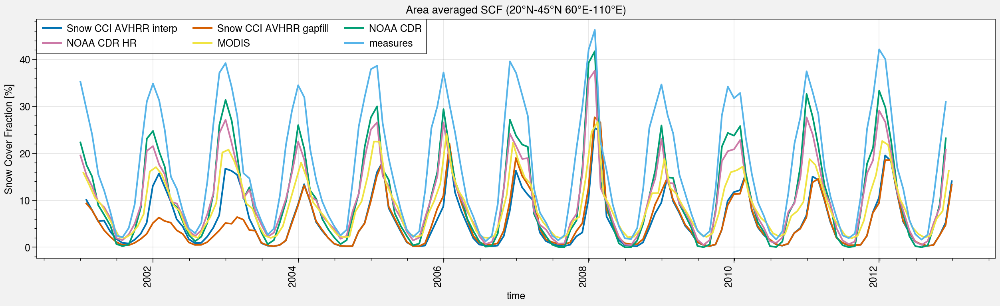

In [75]:
fig, axs = plot.subplots(aspect=4, axwidth=12)

snow_cci_interp_ts.plot(ax= axs[0], label='Snow CCI AVHRR interp')
snow_cci_ts.plot(ax= axs[0], label='Snow CCI AVHRR gapfill')
noaa_cdr_ts.plot(ax= axs[0], label='NOAA CDR')
noaa_cdr_hr_ts.plot(ax= axs[0], label='NOAA CDR HR')
modis_ts.plot(ax= axs[0], label='MODIS')
measures_ts.plot(ax= axs[0], label='measures')

axs.legend()

axs.format(
    ylabel='Snow Cover Fraction [%]',
    title='Area averaged SCF (20°N-45°N 60°E-110°E)'
)

fig.save('img/compare_snc_products_ts.jpg')

# Plot

In [18]:
%%time
noaa_cdr.load()
noaa_cdr_hr.load()
measures.load()
modis.load()
snow_cci.load()
snow_cci_interp.load()

CPU times: user 4.91 s, sys: 2.98 s, total: 7.89 s
Wall time: 28.8 s


<xarray.DataArray 'scfg_interp' (time: 144, lat: 500, lon: 1000)>
array([[[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [        nan,         nan,         nan, ..., 59.95833349,
         60.51666667, 72.99234717],
        [        nan,         nan,         nan, ..., 67.09216604,
         70.425     , 68.625     ],
        [        nan,         nan,         nan, ..., 71.69047674,
         68.36466157, 56.70588235]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
...
        [        nan,         nan,         nan, ..., 12.7166666 ,
         12.7333333 , 12.24999997],
        [        nan,         nan,         nan, ...,  0.        ,
          3.58333333,  3.58333333],
        [        nan,         nan,         nan, ...,  4.98333333,
          0.        ,  1.5       ]],

       [[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [        nan,         nan,         nan, ..., 16.        ,
         22.35483871, 19.22580645],
        [        nan,         nan,         nan, ..., 15.61290323,
         13.14516129, 13.14516129],
        [        nan,         nan,         nan, ..., 17.69354839,
         16.03225806, 15.        ]]])
Coordinates:
  * lat      (lat) float64 20.02 20.07 20.12 20.18 ... 44.83 44.88 44.92 44.98
  * lon      (lon) float64 60.02 60.08 60.12 60.17 ... 109.8 109.9 109.9 110.0
  * time     (time) datetime64[ns] 2001-01-31 2001-02-28 ... 2012-12-31

NOAA CDR
Annual
DJFMA
JJAS
NOAA CDR HR
Annual
DJFMA
JJAS
MEaSUREs
Annual
DJFMA
JJAS
MODIS
Annual
DJFMA
JJAS
Snow CCI gapfill
Annual
DJFMA
JJAS
Snow CCI interp
Annual
DJFMA
JJAS
CPU times: user 1min 36s, sys: 37.4 s, total: 2min 13s
Wall time: 1min 33s


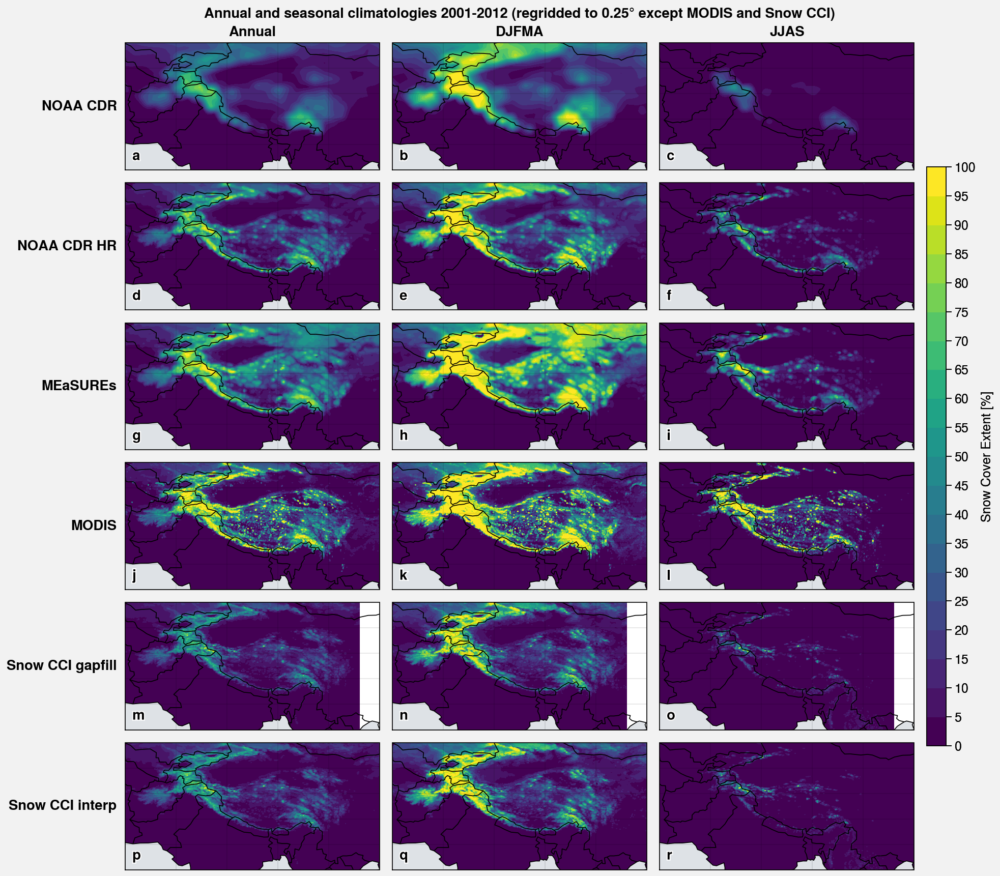

In [24]:
%%time
obs_list = [noaa_cdr, noaa_cdr_hr, measures, modis, snow_cci, snow_cci_interp]
obs_list_names = ['NOAA CDR', 'NOAA CDR HR', 'MEaSUREs', 'MODIS', 'Snow CCI gapfill', 'Snow CCI interp']

fig, axs = plot.subplots(nrows=len(obs_list), ncols=len(seasons), proj='cyl')

k = 0
for i, obs in enumerate(obs_list):
    print(obs_list_names[i])
    for i_season, season in enumerate(seasons):
        print(season)
        m = axs[k].contourf(u.clim(obs, season=seasons[i_season], skipna=True), cmap='viridis', levels=plot.arange(0,100,5))
        k += 1

fig.colorbar(m, label='Snow Cover Extent [%]', length=0.7)

axs.format(
    # Grids, labels and limits
    labels=False, lonlines=10, latlines=5, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    abc=True, abcloc='ll',
    rowlabels=obs_list_names, collabels=seasons,
    suptitle='Annual and seasonal climatologies '+period.start+'-'+period.stop+' (regridded to 0.25° except MODIS and Snow CCI)'
)

fig.save('img/snc_product_clim_without_regrid.jpg')

In [93]:
da = obs_list[3].groupby('time.month').mean('time')

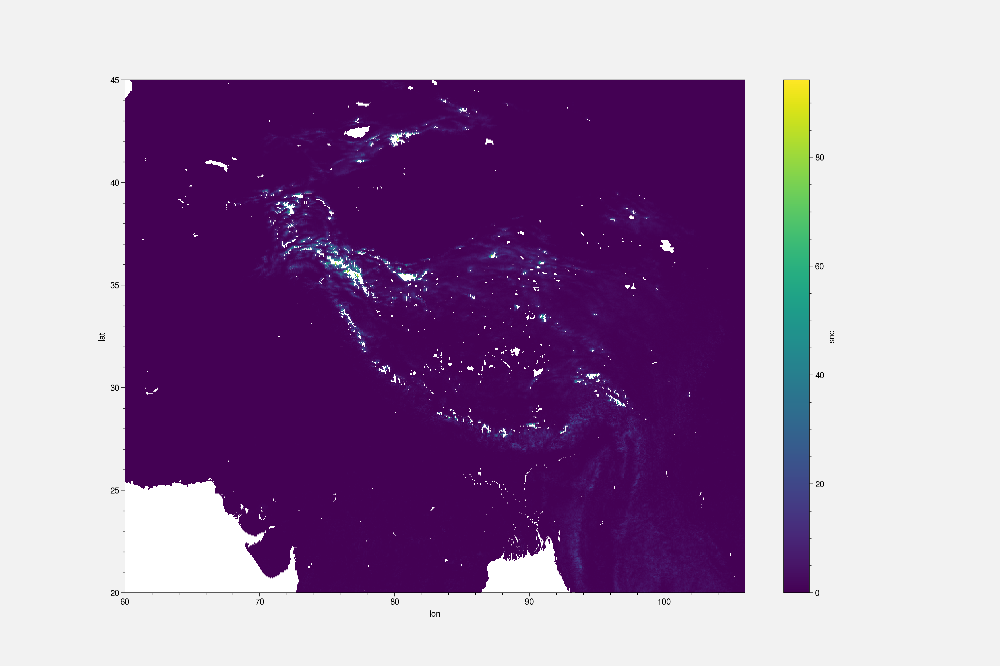

In [92]:
da.where((da.month > 5) & (da.month <10)).mean('month').plot(figsize=(15,10))

### Trends

In [19]:
def corr(x, y, dim):
    return xr.apply_ufunc(
        stats.linregress, x, y,
        input_core_dims=[[dim], [dim]],
        output_core_dims=[[], [], [], [], []],
        vectorize=True
    )

def theilslopes(y, x, dim):
    return xr.apply_ufunc(
        stats.theilslopes, y, x,
        input_core_dims=[[dim], [dim]],
        output_core_dims=[[], [], [], []],
        vectorize=True
    )

In [20]:
%%time
obs_list = [noaa_cdr, noaa_cdr_hr, measures, snow_cci, snow_cci_interp]
obs_list_names = ['NOAA CDR', 'NOAA CDR HR', 'MEaSUREs', 'Snow CCI gapfill', 'Snow CCI interp']

ym_obs = []
for i, obs in enumerate(obs_list):
    print(obs_list_names[i])
    ym_temp = []
    for season in seasons:
        print(season)
        # Make annual mean
        ym = u.year_mean(obs.load(), calendar='standard', season=season)

        # Compute trends
        for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym.year, ym, 'year')):
            ym[arr_name] = arr
            
        # Compute theilslopes (https://docs.scipy.org/doc/scipy-0.15.1/reference/generated/scipy.stats.mstats.theilslopes.html)
        for arr_name, arr in zip(['medslope', 'medintercept', 'lo_slope', 'up_slope'], theilslopes(ym, ym.year, 'year')):
            ym[arr_name] = arr

        ym_temp.append(ym)

    ym_obs.append(xr.concat(ym_temp, pd.Index(seasons, name='season')))

NOAA CDR
Annual
DJFMA


/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  grouper = pd.Grouper(


JJAS
NOAA CDR HR
Annual
DJFMA


/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  grouper = pd.Grouper(


JJAS
MEaSUREs
Annual
DJFMA


/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  grouper = pd.Grouper(


JJAS
Snow CCI gapfill
Annual
DJFMA


/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  grouper = pd.Grouper(


JJAS
Snow CCI interp
Annual
DJFMA


/home/mlalande/.conda/envs/phd_v3/lib/python3.8/site-packages/xarray/core/common.py:1123: FutureWarning: 'base' in .resample() and in Grouper() is deprecated.
The new arguments that you should use are 'offset' or 'origin'.

>>> df.resample(freq="3s", base=2)

becomes:

>>> df.resample(freq="3s", offset="2s")

  grouper = pd.Grouper(


JJAS
CPU times: user 1h 29min 34s, sys: 13min 48s, total: 1h 43min 22s
Wall time: 1h 27min 12s


NOAA CDR
Annual
DJFMA
JJAS
NOAA CDR HR
Annual
DJFMA
JJAS
MEaSUREs
Annual
DJFMA
JJAS
Snow CCI gapfill
Annual
DJFMA
JJAS
Snow CCI interp
Annual
DJFMA
JJAS
CPU times: user 55min 12s, sys: 4min 42s, total: 59min 55s
Wall time: 54min 34s


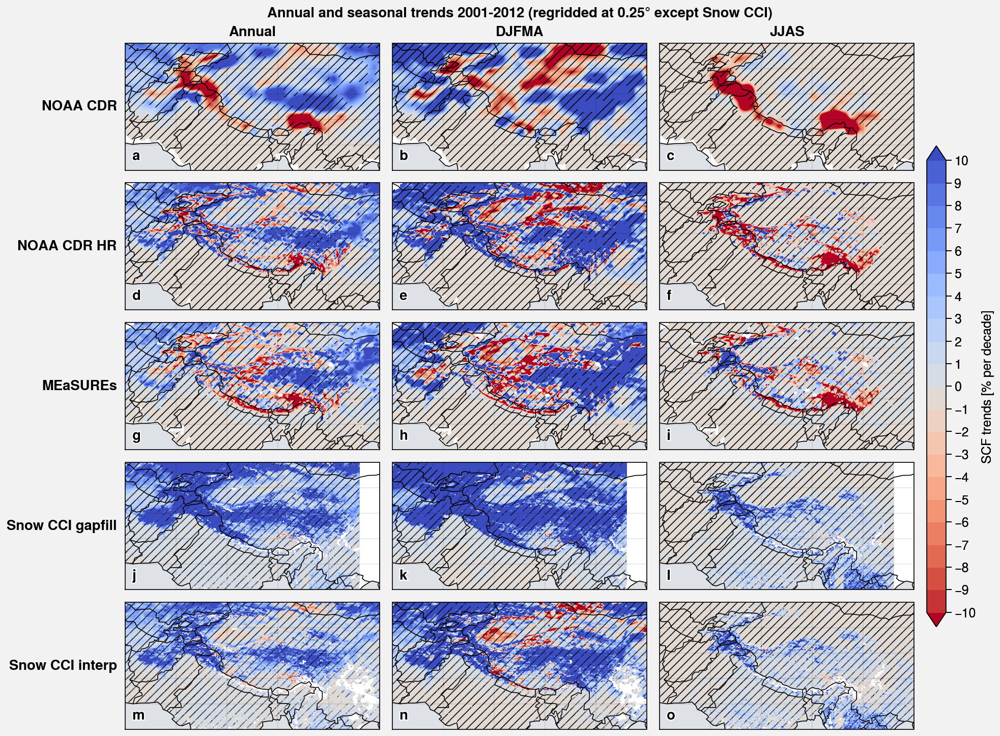

In [21]:
%%time
obs_list = [noaa_cdr, noaa_cdr_hr, measures, snow_cci, snow_cci_interp]
obs_list_names = ['NOAA CDR', 'NOAA CDR HR', 'MEaSUREs', 'Snow CCI gapfill', 'Snow CCI interp']

fig, axs = plot.subplots(nrows=len(obs_list), ncols=len(seasons), proj='cyl')

k = 0
for i, obs in enumerate(ym_obs):
    print(obs_list_names[i])
    for i_season, season in enumerate(seasons):
        print(season)
        m = axs[k].contourf(obs.sel(season=season).slope*10, cmap='CoolWarm_r', levels=plot.arange(-10,10,1), extend='both')
        pvalue = obs.sel(season=season).pvalue
        axs[k].contourf(pvalue.where(pvalue>0.05), hatches=['////'], alpha=0)
        k += 1

fig.colorbar(m, label='SCF trends [% per decade]', length=0.7)        

axs.format(
    # Grids, labels and limits
    labels=False, lonlines=10, latlines=5, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    abc=True, abcloc='ll',
    rowlabels=obs_list_names, collabels=seasons,
    suptitle='Annual and seasonal trends '+period.start+'-'+period.stop+' (regridded at 0.25° except Snow CCI)'
)

fig.save('img/snc_product_trends_without_regrid.jpg')

NOAA CDR
Annual
DJFMA
JJAS
NOAA CDR HR
Annual
DJFMA
JJAS
MEaSUREs
Annual
DJFMA
JJAS
Snow CCI gapfill
Annual
DJFMA
JJAS
Snow CCI interp
Annual
DJFMA
JJAS
CPU times: user 4min 14s, sys: 1min 25s, total: 5min 39s
Wall time: 4min 6s


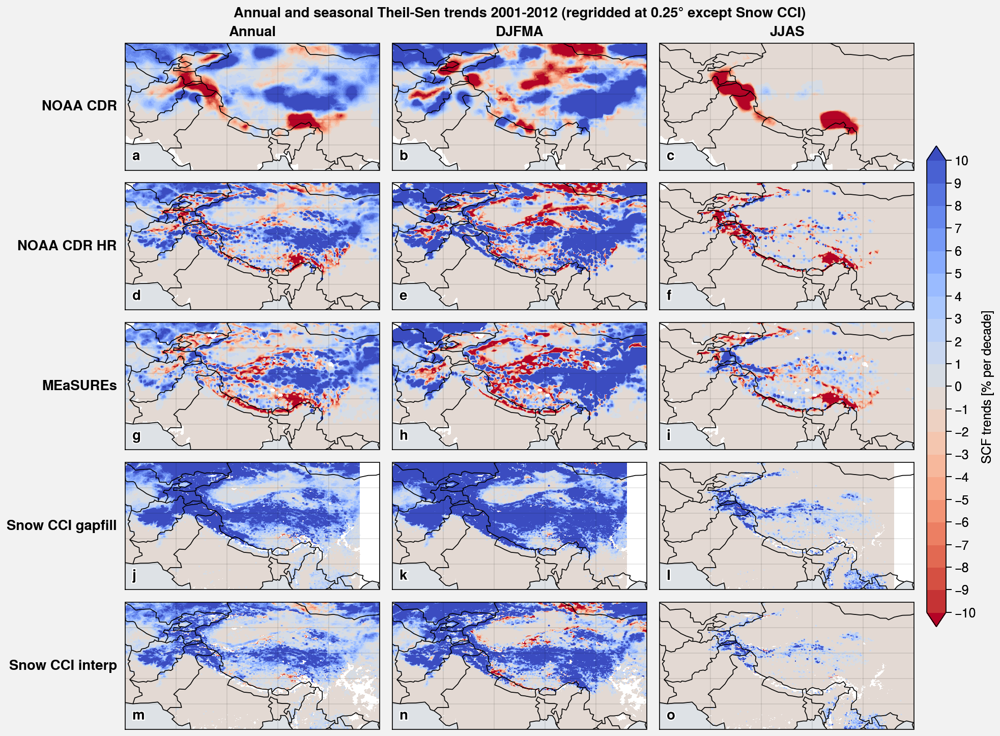

In [22]:
%%time
obs_list = [noaa_cdr, noaa_cdr_hr, measures, snow_cci, snow_cci_interp]
obs_list_names = ['NOAA CDR', 'NOAA CDR HR', 'MEaSUREs', 'Snow CCI gapfill', 'Snow CCI interp']

fig, axs = plot.subplots(nrows=len(obs_list), ncols=len(seasons), proj='cyl')

k = 0
for i, obs in enumerate(ym_obs):
    print(obs_list_names[i])
    for i_season, season in enumerate(seasons):
        print(season)
        m = axs[k].contourf(obs.sel(season=season).medslope*10, cmap='CoolWarm_r', levels=plot.arange(-10,10,1), extend='both')
        k += 1

fig.colorbar(m, label='SCF trends [% per decade]', length=0.7)        

axs.format(
    # Grids, labels and limits
    labels=False, lonlines=10, latlines=5, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    abc=True, abcloc='ll',
    rowlabels=obs_list_names, collabels=seasons,
    suptitle='Annual and seasonal Theil-Sen trends '+period.start+'-'+period.stop+' (regridded at 0.25° except Snow CCI)'
)

fig.save('img/snc_product_theilsen_trends_without_regrid.jpg')

In [55]:
seasons[0]

'Annual'

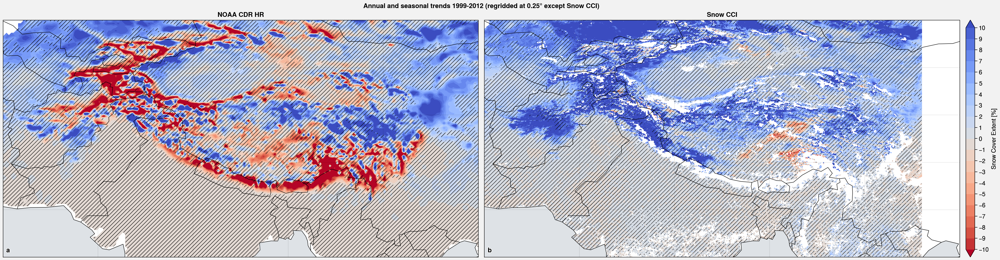

In [62]:
obs_list = [noaa_cdr_hr, snow_cci]
obs_list_names = ['NOAA CDR HR', 'Snow CCI']

fig, axs = plot.subplots(ncols=2, nrows=1, proj='cyl', axwidth=10)

k = 0
for i_season, season in enumerate(['Annual']):
    for obs in [ym_obs[1], ym_obs[3]]:
        m = axs[k].contourf(obs.sel(season=season).slope*10, cmap='CoolWarm_r', levels=plot.arange(-10,10,1), extend='both')
        pvalue = obs.sel(season=season).pvalue
        axs[k].contourf(pvalue.where(pvalue>0.05), hatches=['////'], alpha=0)
        k += 1

fig.colorbar(m, label='Snow Cover Extent [%]')        

axs.format(
    # Grids, labels and limits
    labels=False, lonlines=10, latlines=5, 
    latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    abc=True, abcloc='ll',
    collabels=obs_list_names,
    suptitle='Annual and seasonal trends '+period.start+'-'+period.stop+' (regridded at 0.25° except Snow CCI)'
)

# fig.save('img/snc_product_trends_without_regrid.jpg')

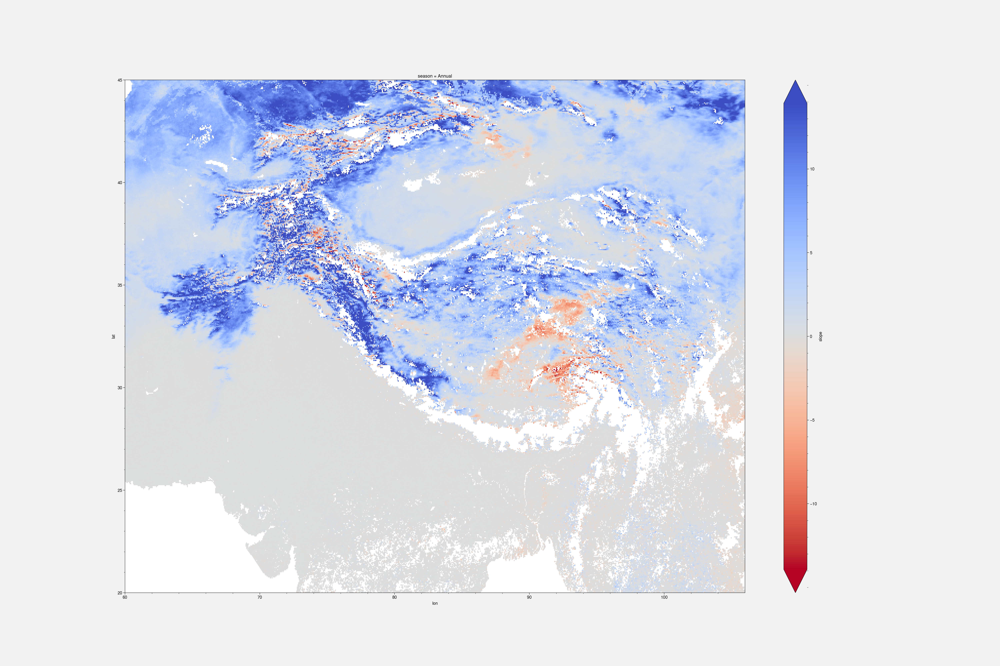

In [60]:
(ym_obs[3][0].slope*10).plot(robust=True, figsize=(30,20), cmap='CoolWarm_r')

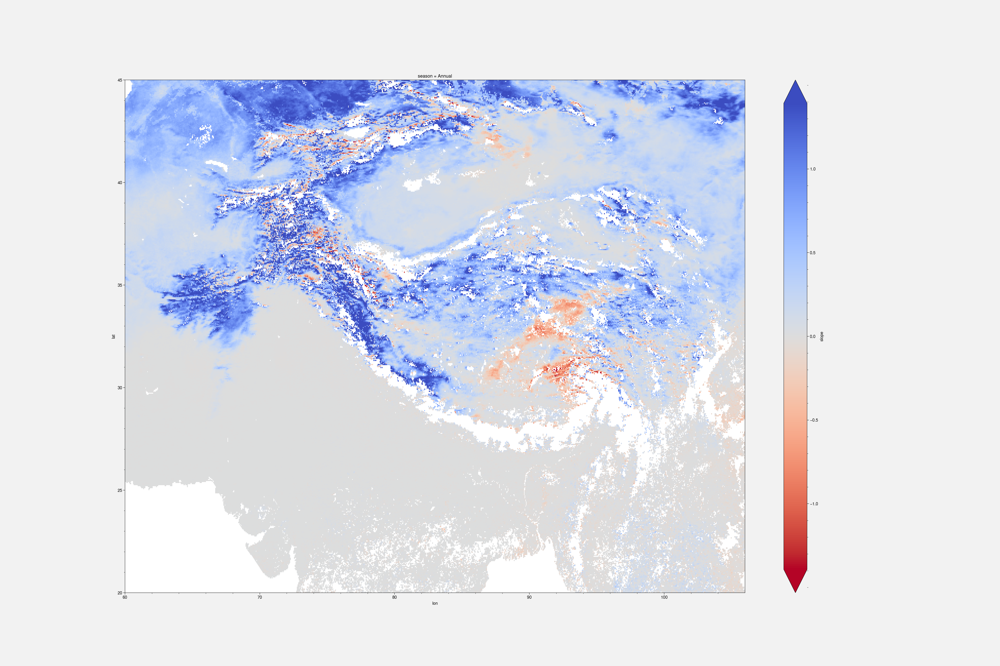

In [47]:
ym_obs[3][0].slope.plot(robust=True, figsize=(30,20), cmap='CoolWarm_r')